In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
from datetime import datetime, timezone
import datetime
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import plotly.express as px
import plotly.graph_objects as go

In [2]:
df = pd.read_csv('final_data.csv', parse_dates= ["time"])

In [3]:
df.head()

,grid_square,internet_cdr,time
0,5056,517.607260,2013-01-11 00:00:00
1,5056,314.551305,2013-01-11 00:10:00
2,5056,341.527327,2013-01-11 00:20:00
3,5056,450.012415,2013-01-11 00:30:00
4,5056,312.166782,2013-01-11 00:40:00


In [4]:
df.shape

(80352, 3)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80352 entries, 0 to 80351
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   grid_square   80352 non-null  int64         
 1   internet_cdr  80352 non-null  float64       
 2   time          80352 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 1.8 MB


<AxesSubplot:xlabel='internet_cdr'>

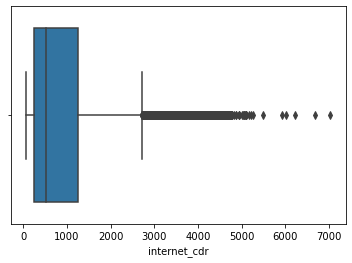

In [6]:
sns.boxplot(x=df['internet_cdr'])

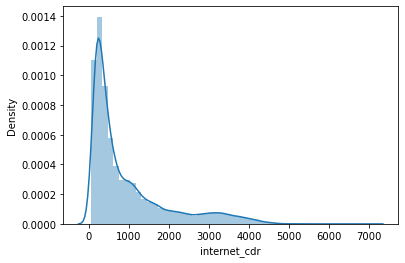

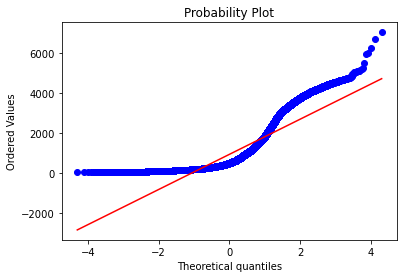

In [7]:
fig = plt.figure()
ax = fig.gca()
sns.distplot(df['internet_cdr'])
plt.show()

#Probability plot
fig = plt.figure()
res = stats.probplot(df['internet_cdr'], plot=plt)

In [8]:
df["internet_cdr"].describe()

count    80352.000000
mean       946.860543
std        997.389860
min         57.823422
25%        253.398926
50%        508.896077
75%       1243.336593
max       7033.454732
Name: internet_cdr, dtype: float64

# Isolation forest
 Isolation Forest is based on the Decision Tree algorithm. 
the first step to anomaly detection is to construct a profile of what's "normal", and then report anything that cannot be considered normal as anomalous.

In [9]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest

#### First apply on a random grid

In [10]:
random_grid = df.groupby("grid_square").get_group(5056)
random_grid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8928 entries, 0 to 8927
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   grid_square   8928 non-null   int64         
 1   internet_cdr  8928 non-null   float64       
 2   time          8928 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 279.0 KB


In [11]:
fig = px.line(random_grid, y='internet_cdr')
fig.update_xaxes(rangeslider_visible=True)
fig.update_traces(line=dict(color = 'turquoise'))
fig.update_layout(title="Random grid(5056)")
fig.show()

In [12]:
# train isolation forest
outliers_fraction = float(.01)
scaler = StandardScaler()
np_scaled = scaler.fit_transform(random_grid["internet_cdr"].values.reshape(-1, 1))
df_data = pd.DataFrame(np_scaled)

model =  IsolationForest(contamination=outliers_fraction)
model.fit(df_data) 

IsolationForest(contamination=0.01)

In [13]:
# predict isolation forest
anomaly = model.predict(df_data)

In [14]:
anomaly = pd.DataFrame(anomaly,columns=['anomaly'])

In [15]:
anomaly

,anomaly
0,1
1,1
2,1
3,1
4,1
...,...
8923,1
8924,1
8925,1
8926,1


In [16]:
random_grid = pd.concat([random_grid, anomaly], axis=1)
random_grid

,grid_square,internet_cdr,time,anomaly
0,5056,517.607260,2013-01-11 00:00:00,1
1,5056,314.551305,2013-01-11 00:10:00,1
2,5056,341.527327,2013-01-11 00:20:00,1
3,5056,450.012415,2013-01-11 00:30:00,1
4,5056,312.166782,2013-01-11 00:40:00,1
...,...,...,...,...
8923,5056,135.564582,2014-01-01 23:10:00,1
8924,5056,143.685136,2014-01-01 23:20:00,1
8925,5056,168.564783,2014-01-01 23:30:00,1
8926,5056,123.497984,2014-01-01 23:40:00,1


In [17]:
random_grid['anomaly'].value_counts()

 1    8840
-1      88
Name: anomaly, dtype: int64

In [18]:
fig1 = px.line(random_grid,  y="internet_cdr")
fig1.update_traces(line=dict(color = 'turquoise'))

anomaly = random_grid.loc[random_grid['anomaly'] == -1, ['internet_cdr']]

fig2 = px.scatter(anomaly,y='internet_cdr')
fig3 = go.Figure(data=fig1.data + fig2.data)

fig3.update_layout(title="Random grid(5056) anomalies points for isolation forest")
fig3.show()

#### Second apply on all grids 

In [19]:
full_grid = df.groupby("grid_square")
grids = list(full_grid.groups.keys())

In [20]:
grids

[5056, 5057, 5058, 5156, 5157, 5158, 5256, 5257, 5258]

In [21]:
data=[]
for grid in grids:
    full_grid = df.groupby("grid_square").get_group(grid)
    data.append(full_grid)
data

[      grid_square  internet_cdr                time
 0            5056    517.607260 2013-01-11 00:00:00
 1            5056    314.551305 2013-01-11 00:10:00
 2            5056    341.527327 2013-01-11 00:20:00
 3            5056    450.012415 2013-01-11 00:30:00
 4            5056    312.166782 2013-01-11 00:40:00
 ...           ...           ...                 ...
 8923         5056    135.564582 2014-01-01 23:10:00
 8924         5056    143.685136 2014-01-01 23:20:00
 8925         5056    168.564783 2014-01-01 23:30:00
 8926         5056    123.497984 2014-01-01 23:40:00
 8927         5056    124.569821 2014-01-01 23:50:00
 
 [8928 rows x 3 columns],
        grid_square  internet_cdr                time
 8928          5057    403.180777 2013-01-11 00:00:00
 8929          5057    310.131943 2013-01-11 00:10:00
 8930          5057    308.682959 2013-01-11 00:20:00
 8931          5057    357.021359 2013-01-11 00:30:00
 8932          5057    303.474336 2013-01-11 00:40:00
 ...        

In [22]:
data[5]

,grid_square,internet_cdr,time
44640,5158,423.603264,2013-01-11 00:00:00
44641,5158,503.495744,2013-01-11 00:10:00
44642,5158,563.369912,2013-01-11 00:20:00
44643,5158,468.893391,2013-01-11 00:30:00
44644,5158,394.529661,2013-01-11 00:40:00
...,...,...,...
53563,5158,152.059390,2014-01-01 23:10:00
53564,5158,149.028083,2014-01-01 23:20:00
53565,5158,128.704956,2014-01-01 23:30:00
53566,5158,131.138869,2014-01-01 23:40:00


In [23]:
x=len(grids)
x

9

In [24]:
# train isolation forest
full_anomaly = pd.DataFrame()
for i in range (x):
    
    full_grid = data[i]
    
    outliers_fraction = float(.01)

    scaler = StandardScaler()
    np_scaled = scaler.fit_transform(full_grid["internet_cdr"].values.reshape(-1, 1))
    df_data = pd.DataFrame(np_scaled)

    model =  IsolationForest(contamination=outliers_fraction)
    model.fit(df_data) 
    anomaly = model.predict(df_data)
    anomaly = pd.DataFrame(anomaly,columns=['anomaly'])
    print("========== grid number {} predicted ==========".format(i+1))
    full_anomaly = full_anomaly.append(anomaly)

========== grid number 1 predicted ==========
========== grid number 2 predicted ==========
========== grid number 3 predicted ==========
========== grid number 4 predicted ==========
========== grid number 5 predicted ==========
========== grid number 6 predicted ==========
========== grid number 7 predicted ==========
========== grid number 8 predicted ==========
========== grid number 9 predicted ==========


In [25]:
full_anomaly.reset_index(inplace= True)
full_anomaly.drop('index', axis=1, inplace=True)
full_anomaly

,anomaly
0,1
1,1
2,1
3,1
4,1
...,...
80347,1
80348,1
80349,1
80350,1


In [26]:
print(df.shape)
print(full_anomaly.shape)

(80352, 3)
(80352, 1)


In [27]:
df = pd.concat([df, full_anomaly], axis=1)
df

,grid_square,internet_cdr,time,anomaly
0,5056,517.607260,2013-01-11 00:00:00,1
1,5056,314.551305,2013-01-11 00:10:00,1
2,5056,341.527327,2013-01-11 00:20:00,1
3,5056,450.012415,2013-01-11 00:30:00,1
4,5056,312.166782,2013-01-11 00:40:00,1
...,...,...,...,...
80347,5258,153.632216,2014-01-01 23:10:00,1
80348,5258,125.178334,2014-01-01 23:20:00,1
80349,5258,104.560788,2014-01-01 23:30:00,1
80350,5258,132.476372,2014-01-01 23:40:00,1


In [28]:
df['anomaly'].value_counts()

 1    79546
-1      806
Name: anomaly, dtype: int64

In [29]:
fig1 = px.line(df,  y="internet_cdr")
fig1.update_traces(line=dict(color = 'rgba(250,100,10,0.2)'))
fig1.update_layout(title="Total grids")
fig1.show()

In [30]:
fig1 = px.line(df,  y="internet_cdr")
fig1.update_traces(line=dict(color = 'rgba(250,100,10,0.2)'))
anomaly = df.loc[df['anomaly'] == -1, ['internet_cdr']] 

fig2 = px.scatter(anomaly,y='internet_cdr')

fig3 = go.Figure(data=fig1.data + fig2.data)
fig3.update_layout(title="Total grids anomalies points for isolation forest")
fig3.show()

In [31]:

# fig, ax = plt.subplots(figsize=(30,10))

# anomaly = df.loc[df['anomaly'] == -1, ['internet_cdr']] 

# ax.plot(df.index, df['internet_cdr'], color='blue', label = 'Normal')
# ax.scatter(anomaly.index,anomaly['internet_cdr'], color='red', label = 'Anomaly')
# ax.set_title('All grids anomalies points', fontsize=20)
# plt.legend()
# plt.show();